In [1]:
pip install albumentations

Note: you may need to restart the kernel to use updated packages.


In [2]:
import cv2
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import os
import shutil
import yaml
import copy
import torch
from tqdm import tqdm
from matplotlib.patches import Rectangle
import random
import shutil
import albumentations as A
from sklearn.model_selection import KFold
import multiprocessing
from multiprocessing import Pool
from sklearn.model_selection import train_test_split
print("number of CPUs :", os.cpu_count())

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


number of CPUs : 4


In [ ]:
pip install ultralytics==8.0.20

In [4]:
from ultralytics import YOLO

# TPU image augmentation
### The TPU's 96 cpu cores will be used in multiprocessing to perform time-consuming image augmentation operations.

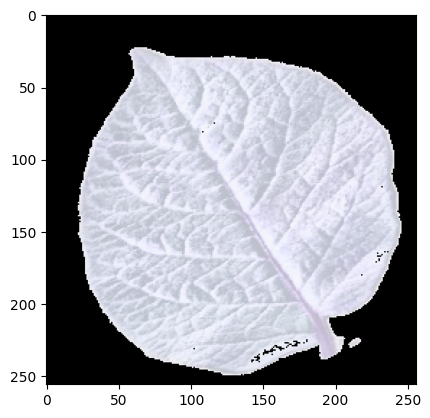

In [3]:
# Testing of the albumentation image augmentation.
a = cv2.imread("/kaggle/input/plantvillage-dataset/segmented/Potato___healthy/046641c1-f837-49eb-b5f2-4109910a027c___RS_HL 1878_final_masked.jpg")

geo_transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.geometric.rotate.Rotate(limit=180, border_mode=cv2.BORDER_CONSTANT, always_apply=False, p=0.5),
    A.augmentations.transforms.ImageCompression(quality_lower=5, quality_upper=25, always_apply=False, p=0.25)])

color_transform = A.Compose([
    A.transforms.CLAHE(p=0.5),
    A.transforms.ColorJitter(brightness=0.7, contrast=0.7, saturation=0.7, hue=0.7, always_apply=False, p=0.5),
    A.transforms.ToGray(p=0.25),
    A.augmentations.transforms.ChannelShuffle(p=0.5),
    A.augmentations.transforms.InvertImg(p=1)])


a = geo_transform(image=a)["image"]

mask = np.sum(a, axis=2) < 50

a = color_transform(image=a)["image"]

a[mask]=0
plt.imshow(a)

For background images without objects : https://github.com/ultralytics/ultralytics/issues/4479#issuecomment-1740485920

In [4]:
# Function to add background in the images.
def add_background(i, bg_image_idx, image, image_name):
    
    # If i is the last index of the list reset the index list.
    if i==19999:
        bg_image_idx = list(range(20000))
        random.shuffle(bg_image_idx)
        i = 0
        
    # Get the background image by its index.
    bg_idx = bg_image_idx[i]
    background_image = background_image_list[bg_idx]
    i+=1

    # Mask pixel positions where the sum of the 3 channels is equal to 0.
    black_pxl_pos = np.sum(image, axis=2) == 0
    
    # Replace the masked pixels in the image grid by the pixels from the background image.
    image[black_pxl_pos] = background_image[black_pxl_pos]

    # Write the image in jpg format in the current working directory.
    cv2.imwrite(image_name + ".jpg", image) 
    
# Function for cropping images.
def crop_image(image, x_min, x_max, box_width, y_min, y_max, box_height):
                            
        z = random.randint(0, 2)

        # Crop on the x axis.
        if z == 0:

            # Crop on the left side.
            if random.randint(0, 1) == 0:
                x_min += int(box_width/2)

            # Crop on the right side.
            else:
                x_max -= int(box_width/2)

        # Crop on the y axis.
        elif z == 1:

            # Crop from the top.
            if random.randint(0, 1) == 0:
                y_min += int(box_height/2)

            # Crop from the bottom.
            else:
                y_max -= int(box_height/2)

        # Crop on both axis.
        else:

            if random.randint(0, 1) == 0:
                x_min += int(box_width/2)
            else:
                x_max -= int(box_width/2)   

            if random.randint(0, 1) == 0:
                y_min += int(box_height/2)
            else:
                y_max -= int(box_height/2)

        # Before x_min, set 0.
        image[:, :x_min, :] = 0

        # After x_max, set 0.
        image[:, x_max:, :] = 0

        # Before y_min, set 0.
        image[:y_min, :, :] = 0

        # After y_max, set 0.
        image[y_max:, :, :] = 0

        # Recompute the box coordinates on the cropped image.
        nonzero_pxl_pos = np.nonzero(image)

        # Check if the image contains enough colored pixels.
        if len(nonzero_pxl_pos[1]) < 5000:
            box = False
        else:
            x_min, x_max = min(nonzero_pxl_pos[1]), max(nonzero_pxl_pos[1])
            y_min, y_max = min(nonzero_pxl_pos[0]), max(nonzero_pxl_pos[0])    
            box = True
            
        return (image, x_min, x_max, y_min, y_max, box)
        
# Function to do the image augmentation.
def augment_image(nbr_iter, crop_proba, flip_proba, gray_proba, color_proba,
                  shufflechannel_proba,dict_of_image_idx_per_class, lock):
    
    list_of_image_grids, list_of_image_labels = [], []
    
    # Each process receives its own deep copy of the dictionary of index list by class.
    # The dict_of_image_idx_per_class is shared between all processes.
    # However, copy_dict_of_image_idx_per_class is not shared between processes.
    copy_dict_of_image_idx_per_class = copy.deepcopy(dict_of_image_idx_per_class)
    
    # Create the transformation pipeline for the geometry.
    geo_transform = A.Compose([
        A.HorizontalFlip(p=flip_proba),
        A.VerticalFlip(p=flip_proba),
        A.geometric.rotate.Rotate(limit=180, border_mode=cv2.BORDER_CONSTANT, always_apply=False, p=1),
        A.augmentations.transforms.ImageCompression(quality_lower=5, quality_upper=25, always_apply=False, p=0.25)])

    # Create the transformation pipeline for the colors.
    color_transform = A.Compose([
        A.transforms.CLAHE(),
        A.transforms.ColorJitter(brightness=0.7, contrast=0.7, saturation=0.7, hue=0.7, always_apply=False, p=color_proba),
        A.transforms.ToGray(p=gray_proba),
        A.augmentations.transforms.ChannelShuffle(p=shufflechannel_proba),
        A.augmentations.transforms.InvertImg(p=0.25)])

    # Create a random seed so that each process does not produce the same augmentations.
    pid = os.getpid()
    random.seed(pid)
    
    # Create indexes of background images.
    # These background images will replace all pixels equal to 0 in the segmented images.
    bg_image_idx = list(range(1000))
    random.shuffle(bg_image_idx)
    
    list_of_directories = sorted(os.listdir('/kaggle/input/plantvillage-dataset/segmented/'))
    
    single_im_size = 256
    os.chdir('/kaggle/working/yolo_images')
    i = 0

    for im_number in tqdm(range(nbr_iter)):
        
        # 256 * 256 images will be stacked horizontally and vertically in a numpy array.
        # This will form a mosaic or square grid.
        # The scale factor indicates how many images will be stacked. If 4, the mosaic will stack 4 * 4 images.
        # Subsequently, the grid size will become 256 * 4 and will be resized to 256 to avoid having images that are too large.
        # As a result, each stacked image will be reduced by 4.
        for scale_factor in [1, 2, 4, 6]:
            
            image_label = []
            
            # Grid size before resizing is proportional to the number of images stacked.
            grid_size = single_im_size * scale_factor
            
            # Give a unique name.
            aug_image_name = f"train_grid_size_{scale_factor}_id_{im_number}_pid_{pid}"

            # Then, we iterate over the row and column of the future grid.
            # Each time, we choose an image randomly.
            for row in range(scale_factor):
                for col in range(scale_factor):
                    
                    # The boolean is used later to draw the bounding box.
                    box = True
                    
                    # Select a random category/directory.
                    directory = random.choice(list_of_directories)

                    # Select the list of index associated to images of that category.
                    image_idx_list = dict_of_image_idx_per_class[directory]
                    
                    # Add a lock to avoid concurency between processes.
                    # So only one process at a time is executing the code under the lock. 
                    # It will prevent a bug when, a process is picking an index from the list
                    # and another process is already removing the same index from that list.
                    with lock:
                        
                        # Check if the list of index is empty. 
                        if not image_idx_list:
                            
                            # If empty, deep copy it from the initial original copy.
                            dict_of_image_idx_per_class[directory] = copy.deepcopy(copy_dict_of_image_idx_per_class[directory])
                            image_idx_list = dict_of_image_idx_per_class[directory]
                                
                        # Pick a random index associated to an image.
                        image_idx = random.choice(image_idx_list)
                        
                        # Remove the index to avoid selecting one image more often than the others.
                        image_idx_list.remove(image_idx)
                        
                        assert image_idx not in image_idx_list, f"The index {image_idx} is not removed from the list"
                        assert image_idx in copy_dict_of_image_idx_per_class[directory], f"The index {image_idx} is unexpectedly removed from the deep copy"
                        assert len(copy_dict_of_image_idx_per_class[directory]) > len(image_idx_list), f"The deep copy should have more elements than the original dictionary"

                        # In the dictionary of lists of images by class, select the image with its index.
                        image = dict_of_image_list_per_class[directory][image_idx]
                    
                    # Application of the geometric transformation.
                    image = geo_transform(image=image)["image"]

                    # Get a mask of the augmented image where the sum of the intensities of the 3 channels is less than 50.
                    mask = np.sum(image, axis=2) < 50

                    # Then transform the colors, although the color transformation modifies the black pixels.
                    # And we need the black pixels from the segmented image to set the bounding box.
                    image = color_transform(image=image)["image"]

                    # This is why we recover the black pixels with the mask. We reset the masked pixels to the intensity 0.
                    # Picking a value of 50 for the mask will sharpen the boundary
                    # between the black pixels and the leaf pixels. This will bring the bounding box closer to the leaf.
                    image[mask]=0    
                    
                    # Return the indices of the elements that are non-zero, consequently :
                    #    - The minimum indice on the column axis will be the bouding box left side.
                    #    - The maximum indice on the column axis will be the bouding box right side.
                    #    - The minimum indice on the row axis will be the bouding box lower side.
                    #    - The maximum indice on the row axis will be the bouding box upper side.
                    
                    # Exemple with a 3D array of shape(3,3,3): 
                    # >>> x = np.array([[[1,5,0],
                    #                    [0,0,5],
                    #                    [0,9,9]],
                    #                   [[1,5,0],
                    #                    [0,0,5],
                    #                    [0,9,9]],
                    #                   [[1,5,0],
                    #                    [0,0,5],
                    #                    [0,9,9]]])
                    # >>> np.nonzero(x)
                    # (array([0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2]),   For the 2D array in the third dimension
                    #  array([0, 0, 1, 2, 2, 0, 0, 1, 2, 2, 0, 0, 1, 2, 2]),   For row
                    #  array([0, 1, 2, 1, 2, 0, 1, 2, 1, 2, 0, 1, 2, 1, 2]))   For column
                    nonzero_pxl_pos = np.nonzero(image)
                    assert len(nonzero_pxl_pos[1]) == len(nonzero_pxl_pos[0])
                    
                    # If there are less than 5000 colored pixels don't diplay the box.
                    # It means the leaf is too little or erased in the image.
                    if len(nonzero_pxl_pos[1]) < 5000:
                        print(directory, image_idx)
                        box = False     
                        
                    # Compute the bounding box from indices of the colored pixels.
                    else:
                        
                        # The point (x_min, y_min) is the upper left corner of the box.
                        # The point (x_max, y_max) is the lower right corner.
                        x_min, x_max = min(nonzero_pxl_pos[1]), max(nonzero_pxl_pos[1])
                        y_min, y_max = min(nonzero_pxl_pos[0]), max(nonzero_pxl_pos[0])
                        box_width = (x_max-x_min)
                        box_height = (y_max-y_min)

                        # Crop the leaf in respect to the crop_proba.
                        if random.random() < crop_proba:
                            image, x_min, x_max, y_min, y_max, box = crop_image(image, x_min, x_max, box_width,
                                                                                y_min, y_max, box_height)

                    # If the image contains enough colored pixels the box can be set.
                    if box:
                        
                        # The box coordinates are calculated from the original single image of shape (256, 256).
                        # The grid image will later be scaled down from a shape of (256 * row, 256 * col) to (256, 256).
                        # Therefore, the width and height of the box is also scaled down to fit in the final grid shape.
                        box_width = (x_max-x_min) / grid_size
                        box_height = (y_max-y_min) / grid_size
                        
                        # The center of the box is computed as pixels indices in the original (256, 256) image.
                        # For instance the center (150, 13) is at the column 150 and row 13.
                        x_box_center = x_min + (x_max-x_min) / 2
                        y_box_center = y_min + (y_max-y_min) / 2
                                        
                        # Then, the center of the box is shifted in function of the row and column
                        # where its associated image is positionned on the grid.
                        x_box_center_shifted = x_box_center + (col * single_im_size)
                        y_box_center_shifted = y_box_center + (row * single_im_size)
                                        
                        # Finally, to match the coordinates format of yolov8 the center coordinates are converted.
                        # They are converted from a pixel position to a ratio of the width and height of the grid.
                        # for instance : (0.8964, 0.7626).
                        x_box_center_shifted_ratio = x_box_center_shifted / grid_size
                        y_box_center_shifted_ratio = y_box_center_shifted / grid_size
                                        
                        # The coordinates are appended in a list.
                        image_label.append(f"{dict_of_encoded_class[directory]} {x_box_center_shifted_ratio} {y_box_center_shifted_ratio} {box_width} {box_height}\n")
                    
                    # img_aug represents a row of stacked images or a single image if the scale_factor is to 1.
                    # If col == 0 we are at the first image of a row so we don't stack the image.
                    if col == 0:
                        img_aug = image
                                        
                    # Else, we are not the first image of the row.
                    # So, the image can be stacked horizontally next to the image on the left in that row.                    
                    else:
                        img_aug = np.hstack((img_aug, image))
                        
                # img_grid represents the vertical stack of the row of images.
                # Similarily if we are at the first row we can't stack the row of images.           
                if row == 0:
                    img_grid = img_aug
                                        
                # Else, we are not at the first row of the grid.
                # So, the row of images can be stacked vertivally below the previous row above.                    
                else:
                    img_grid = np.vstack((img_grid, img_aug))
                                        
            # Resizing of the final image grid.
            img_grid = cv2.resize(img_grid, (single_im_size, single_im_size))
            
            # Append the label and the image grid.
            list_of_image_labels = [copy.deepcopy(image_label)] + list_of_image_labels
            list_of_image_grids = [copy.deepcopy(img_grid)] + list_of_image_grids
            
            superimpose = False
            
            # If 4 grids are in the list, superimpose them randomly and in pairs.
            if len(list_of_image_grids) == 4:
                
                superimpose = True
                list_of_stacked_im, list_of_stacked_im_labels = [], []
                
                for img_grid, img_grid_label in list(zip(list_of_image_grids, list_of_image_labels)):
                    
                    # When the list is empty break the loop.
                    if not list_of_image_grids:
                        break

                    # Get the position of the black pixels in the first image.
                    black_pxl_pos = np.sum(img_grid, axis=2) == 0
                    stacked_im = img_grid
                    
                    # Randomly select a second image from the list_of_image_grids.
                    stacked_im_2_idx = random.randint(1, len(list_of_image_grids)-1)
                    stacked_im_2 = list_of_image_grids[stacked_im_2_idx]
                
                    # With the same mask set the black pixels in the first image equal to the pixels in second image.
                    # It will produce an image where stacked_im seems to be pasted on top of stacked_im_2.
                    stacked_im[black_pxl_pos] = stacked_im_2[black_pxl_pos]
                    
                    # Append the superimposed image with their associated labels.
                    list_of_stacked_im.append(stacked_im)
                    list_of_stacked_im_labels.append([img_grid_label, list_of_image_labels[stacked_im_2_idx]]) 
                    
                    # Remove the second image from the list.
                    del list_of_image_grids[stacked_im_2_idx]
                    
                    # Remove the first image from the list.
                    list_of_image_grids = list_of_image_grids[1:]
                    
                    # Remove the second label from the list.
                    del list_of_image_labels[stacked_im_2_idx]
                    
                    # Remove the first label from the list.
                    list_of_image_labels = list_of_image_labels[1:]
                    
                # At the end of the loop empty the lists.
                list_of_image_grids = []
                list_of_image_labels = []
                
            # Add a background image to the superimposed image.
            if superimpose:
                                
                list_of_stacked_image_names = []
                for indice, stacked_image in enumerate(list_of_stacked_im):
                    
                    # Give a unique name.
                    stacked_image_name = f"train_stacked_image_{pid}_{im_number}_{indice}"
                        
                    list_of_stacked_image_names.append(stacked_image_name)
                    add_background(i, bg_image_idx, stacked_image, stacked_image_name)
                    
            # Add a background image to the image grid not superimposed.
            else:
                add_background(i, bg_image_idx, img_grid, aug_image_name)
              
            # Write the the box coordinates of the superimposed grid in the text file.
            if superimpose:
                for stacked_image_name, stacked_im_labels in list(zip(list_of_stacked_image_names,
                                                                      list_of_stacked_im_labels)):
                    
                    with open(f"/kaggle/working/yolo_labels/{stacked_image_name}.txt", "w") as f:
                        for image_label in stacked_im_labels:
                            for label in image_label:
                                 f.write(label)
                                    
            # Write the the box coordinates of the standard grid in the text file.
            else:
                with open(f"/kaggle/working/yolo_labels/{aug_image_name}.txt", "w") as f:
                    for label in image_label:
                         f.write(label)
                        
                            
    os.chdir('/kaggle/working')
    
# Function to add a bounding box and background to images in the test set.
def make_test_image(category, list_of_index, list_of_bg_image):
    
    os.chdir('/kaggle/working/yolo_images') 
    pid = os.getpid()
    
    for image_idx, bg_image_idx in list(zip(list_of_index, list_of_bg_image)):

        image_name = f"test_image_{category}_{pid}_{image_idx}"

        # In the dictionary of lists of images by class, select the image with its index.
        image = dict_of_image_list_per_class[category][image_idx]

        # Get a mask of the image where the sum of the intensities of the 3 channels is less than 50.
        mask = np.sum(image, axis=2) < 50

        # We set the masked pixels to intensity 0.
        image[mask]=0    

        nonzero_pxl_pos = np.nonzero(image)

        # If there are less than 5000 colored pixels we don't diplay the box.
        # It means the leaf is too little or erased in the image.
        if len(nonzero_pxl_pos[1]) < 5000 :
            print(category, image_idx)
            continue

        # Compute the bounding box from the indices of the colored pixels.
        else:

            # The point (x_min, y_min) is the upper left corner of the box.
            # The point (x_max, y_max) is the lower right corner.
            x_min, x_max = min(nonzero_pxl_pos[1]), max(nonzero_pxl_pos[1])
            y_min, y_max = min(nonzero_pxl_pos[0]), max(nonzero_pxl_pos[0])
            box_width = (x_max-x_min) / 256
            box_height = (y_max-y_min) / 256            

            x_box_center = (x_min + (x_max-x_min) / 2) / 256
            y_box_center = (y_min + (y_max-y_min) / 2) / 256

            # The coordinates are appended in a list.
            image_label = f"{dict_of_encoded_class[category]} {x_box_center} {y_box_center} {box_width} {box_height}\n"
            
        # Get the background image by its index.
        background_image = background_image_list[bg_image_idx]

        # Mask pixel positions where the sum of the 3 channels equals 0.
        black_pxl_pos = np.sum(image, axis=2) == 0

        # Replace the masked pixels in the image grid by the pixels of the background image.
        image[black_pxl_pos] = background_image[black_pxl_pos]

        # write the image in jpg format in the current working directory.
        cv2.imwrite(image_name + ".jpg", image)             

        # Write the text file with the box coordinates of the image grid.
        with open(f"/kaggle/working/yolo_labels/{image_name}.txt", "w") as f:
             f.write(image_label)

In [5]:
# This code will empty the directories and the augmentation function will have to be run again.
if not os.path.isdir('/kaggle/working/yolo_images'):
    os.mkdir('/kaggle/working/yolo_images')
    
if not os.path.isdir('/kaggle/working/yolo_labels'):
    os.mkdir('/kaggle/working/yolo_labels')

for file in os.listdir('/kaggle/working/yolo_labels/'):
        os.remove("/kaggle/working/yolo_labels/" + file)
        
for file in os.listdir('/kaggle/working/yolo_images/'):
        os.remove("/kaggle/working/yolo_images/" + file)
        
os.listdir("/kaggle/working/")

['yolo_labels',
 'augmented_images.png',
 '.virtual_documents',
 'plantvillage',
 'yolo_images',
 'yolov8x.pt']

https://docs.ultralytics.com/yolov5/tutorials/tips_for_best_training_results/

In [7]:
# Copy the images in RAM instead of reading them from the directories.
# This will speed up their access during the image augmentation.
single_im_size = 256
background_image_list = []

for bg_image in tqdm(os.listdir("/kaggle/input/openimagesv7")):
    
    # Read the image.
    background_image = cv2.imread("/kaggle/input/openimagesv7/" + bg_image)
    
    # Converting the color space to match the color space of the plantivillage images.
    background_image = cv2.cvtColor(background_image, cv2.COLOR_BGR2RGB)
    
    # Resizing the image to match the size of the plantivillage images.
    background_image = cv2.resize(background_image, (single_im_size, single_im_size))
    background_image_list.append(background_image)
    
# Place the segmented images by categories in a dictionary of lists.
# Where each key is a category name associated to a list as a value.
dict_of_image_list_per_class = {} 
for directory in tqdm(sorted(os.listdir('/kaggle/input/plantvillage-dataset/segmented/'))):
    
    image_list = []
    path = "/kaggle/input/plantvillage-dataset/segmented/" + directory
    
    for seg_image in os.listdir(path):
        
        image = cv2.imread(path + "/" + seg_image)
        image = cv2.resize(image, (single_im_size, single_im_size))
        image_list.append(image)
        
    dict_of_image_list_per_class[directory] = image_list

100%|██████████| 38/38 [08:02<00:00, 12.71s/it]


In [8]:
# Get the number of images and instances produced with the augment_image()
# function given the number of iterations as parameter.
number_of_iteration = 50

number_of_images = os.cpu_count() * 5 * number_of_iteration
number_of_instances = ((1 + 4 + 16) + (1 + 4 + 16 + 36)) * number_of_iteration * os.cpu_count()

print("number of train images :", number_of_images,
      "\n number of instances :", int(number_of_instances),
      "\n number of instances per class :", int(number_of_instances/38))

number of train images : 24000 
 number of instances : 374400 
 number of instances per class : 9852


In [9]:
# Creating the augmented images of the training set.
if __name__ == "__main__":
    
    nbr_iter = 50
    test_proportion = 20
    dict_of_encoded_class = dict(zip(os.listdir('/kaggle/input/plantvillage-dataset/segmented/'), range(38)))

    procs = []
    
    # Creating a shared dictionary between processes and a lock using the manager.
    manager = multiprocessing.Manager()
    dict_of_train_image_idx_per_class = manager.dict()
    
    # The dictionary of test images is not shared because it will not use the multiprocesing.
    dict_of_test_image_idx_per_class = {}
    
    # Performing a stratified split of the train and test images with 20% of the images in the test set.
    for directory in os.listdir('/kaggle/input/plantvillage-dataset/segmented/'):
        
        
        # We create a dictionary of indexes which will be used to pick images in the dictionary of image.
        # Like so the dictionary of images is in read only and it is not modified during the augmentation process.
        # This is simpler to keep the dictionary of images intact.
        nbr_of_images = len(os.listdir("/kaggle/input/plantvillage-dataset/segmented/" + directory))
        list_of_idx = list(range(nbr_of_images))
                            
        # Get the indexes for the test set.
        test_images_idx = int((nbr_of_images / 100) * test_proportion)
                            
        # Store the list of indexes by categories in a dicionary in the same way than the dict_of_image_list_per_class.
        dict_of_train_image_idx_per_class[directory] = list_of_idx[:-test_images_idx]
        dict_of_test_image_idx_per_class[directory] = list_of_idx[-test_images_idx:]
        
    lock = manager.Lock()

    # For each cpu instantiating a process with the function. 
    for i in range(os.cpu_count()):

        proc = multiprocessing.Process(target=augment_image, args=(nbr_iter, 0.5, 0.5, 0.3, 0.3, 0.3,
                                                                   dict_of_train_image_idx_per_class, lock))
        procs.append(proc)
        proc.start()

    # complete the processes
    for proc in procs:
        proc.join()
        

  0%|          | 0/50 [00:00<?, ?it/s].66s/it]

Grape___Leaf_blight_(Isariopsis_Leaf_Spot)

  0%|          | 0/50 [00:00<?, ?it/s]

 575

  2%|▏         | 1/50 [00:03<02:05,  2.57s/it]

  2%|▏         | 1/50 [00:04<03:45,  4.60s/it]

Tomato___Septoria_leaf_spot 426

  2%|▏         | 1/50 [00:04<03:47,  4.65s/it]

  4%|▍         | 2/50 [00:07<03:19,  4.16s/it]

Soybean___healthy 2091


  6%|▌         | 3/50 [00:13<03:45,  4.80s/it]

Tomato___Septoria_leaf_spot 426


  4%|▍         | 2/50 [00:10<04:06,  5.14s/it]

Tomato___Tomato_Yellow_Leaf_Curl_Virus 

  4%|▍         | 2/50 [00:10<04:06,  5.14s/it]

3734


  8%|▊         | 4/50 [00:18<03:35,  4.70s/it]

Grape___Black_rot 433


  8%|▊         | 4/50 [00:19<03:46,  4.92s/it]

Grape___Black_rot 433

 10%|█         | 5/50 [00:23<03:44,  4.99s/it]

 18%|█▊        | 9/50 [00:35<03:14,  4.75s/it]

Grape___Leaf_blight_(Isariopsis_Leaf_Spot) 575

  8%|▊         | 4/50 [00:20<03:54,  5.09s/it]

 14%|█▍        | 7/50 [00:30<03:31,  4.93s/it]

Grape___Leaf_blight_(Isariopsis_Leaf_Spot) 575


 12%|█▏        | 6/50 [00:29<03:38,  4.97s/it]]

Tomato___Septoria_leaf_spot

 16%|█▌        | 8/50 [00:37<03:25,  4.89s/it]

 426


 18%|█▊        | 9/50 [00:41<03:24,  5.00s/it]]

Tomato___Septoria_leaf_spot 334


 16%|█▌        | 8/50 [00:38<03:32,  5.06s/it]]

Grape___Black_rot 433


 22%|██▏       | 11/50 [00:51<03:14,  4.99s/it]

Grape___Black_rot 433


 24%|██▍       | 12/50 [00:56<03:08,  4.96s/it]

Tomato___Septoria_leaf_spot 334


 22%|██▏       | 11/50 [00:55<03:19,  5.12s/it]

Grape___Black_rot 

 28%|██▊       | 14/50 [01:03<03:00,  5.01s/it]

433


 24%|██▍       | 12/50 [00:57<03:09,  4.98s/it]

Tomato___Septoria_leaf_spot 426


 30%|███       | 15/50 [01:10<02:57,  5.08s/it]

Grape___Black_rot 

 24%|██▍       | 12/50 [01:01<03:11,  5.03s/it]

433


 30%|███       | 15/50 [01:17<03:01,  5.19s/it]

Grape___Black_rot 433

 34%|███▍      | 17/50 [01:24<02:48,  5.10s/it]


Grape___Leaf_blight_(Isariopsis_Leaf_Spot) 575


 46%|████▌     | 23/50 [01:46<02:14,  4.98s/it]

Pepper,_bell___healthy 836


 40%|████      | 20/50 [01:39<02:30,  5.03s/it]

Grape___Black_rot 433


 42%|████▏     | 21/50 [01:43<02:25,  5.02s/it]

Grape___Black_rot 

 46%|████▌     | 23/50 [01:48<02:14,  4.97s/it]

433


 56%|█████▌    | 28/50 [02:13<01:49,  4.99s/it]

Grape___Leaf_blight_(Isariopsis_Leaf_Spot) 575


 56%|█████▌    | 28/50 [02:14<01:53,  5.15s/it]

Grape___Black_rot

 50%|█████     | 25/50 [02:08<02:06,  5.07s/it]

 48%|████▊     | 24/50 [02:02<02:11,  5.07s/it]

433


 56%|█████▌    | 28/50 [02:20<01:51,  5.07s/it]

Grape___Leaf_blight_(Isariopsis_Leaf_Spot)

 54%|█████▍    | 27/50 [02:17<01:57,  5.13s/it]

 575


 66%|██████▌   | 33/50 [02:37<01:26,  5.08s/it]

Grape___Black_rot 433


 64%|██████▍   | 32/50 [02:44<01:32,  5.17s/it]

Grape___Leaf_blight_(Isariopsis_Leaf_Spot) 575


 74%|███████▍  | 37/50 [03:05<01:03,  4.92s/it]

Grape___Black_rot 433


 72%|███████▏  | 36/50 [03:01<01:10,  5.01s/it]

Grape___Leaf_blight_(Isariopsis_Leaf_Spot) 575


 74%|███████▍  | 37/50 [03:04<01:05,  5.07s/it]

Grape___Leaf_blight_(Isariopsis_Leaf_Spot) 575


 76%|███████▌  | 38/50 [03:11<01:00,  5.05s/it]

Grape___Leaf_blight_(Isariopsis_Leaf_Spot) 575


 76%|███████▌  | 38/50 [03:10<01:01,  5.10s/it]

Tomato___Septoria_leaf_spot 334


 78%|███████▊  | 39/50 [03:18<00:58,  5.32s/it]

Grape___Leaf_blight_(Isariopsis_Leaf_Spot) 575


 78%|███████▊  | 39/50 [03:19<00:55,  5.06s/it]

Pepper,_bell___healthy 836


 84%|████████▍ | 42/50 [03:33<00:40,  5.06s/it]

Pepper,_bell___healthy 836

 88%|████████▊ | 44/50 [03:40<00:30,  5.06s/it]

 98%|█████████▊| 49/50 [04:01<00:05,  5.08s/it]

Tomato___Septoria_leaf_spot 426


 96%|█████████▌| 48/50 [03:59<00:08,  4.28s/it]

Grape___Black_rot 433


 98%|█████████▊| 49/50 [04:01<00:03,  3.80s/it]

Tomato___Septoria_leaf_spot 334


100%|██████████| 50/50 [04:07<00:00,  4.95s/it]


In [12]:
# Add the bounding box and background to the test images.
for item in tqdm(dict_of_test_image_idx_per_class.items()):
    
    list_of_index = item[1]
    category = item[0]
    
    bg_image_idx = list(range(len(list_of_index)))
    random.shuffle(bg_image_idx)
    
    print(category, "number of images: ", len(list_of_index))
    
    make_test_image(category, list_of_index, bg_image_idx)

  0%|          | 0/38 [00:00<?, ?it/s]

Tomato___Late_blight number of images:  381


  3%|▎         | 1/38 [00:09<05:56,  9.63s/it]

Tomato___healthy number of images:  318


  5%|▌         | 2/38 [00:18<05:31,  9.22s/it]

Grape___healthy number of images:  84


  8%|▊         | 3/38 [00:21<03:40,  6.29s/it]

Orange___Haunglongbing_(Citrus_greening) number of images:  1101


 11%|█         | 4/38 [00:56<09:57, 17.58s/it]

Soybean___healthy number of images:  1018


 13%|█▎        | 5/38 [01:30<12:52, 23.42s/it]

Squash___Powdery_mildew number of images:  367


 16%|█▌        | 6/38 [01:44<10:55, 20.48s/it]

Potato___healthy number of images:  30


 18%|█▊        | 7/38 [01:45<07:17, 14.10s/it]

Corn_(maize)___Northern_Leaf_Blight number of images:  197


 21%|██        | 8/38 [01:53<06:06, 12.21s/it]

Tomato___Early_blight number of images:  200


 24%|██▎       | 9/38 [01:59<04:54, 10.14s/it]

Tomato___Septoria_leaf_spot number of images:  354


 26%|██▋       | 10/38 [02:09<04:39,  9.99s/it]

Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot number of images:  102


 29%|██▉       | 11/38 [02:13<03:43,  8.28s/it]

Strawberry___Leaf_scorch number of images:  221


 32%|███▏      | 12/38 [02:21<03:29,  8.05s/it]

Peach___healthy number of images:  72


 34%|███▍      | 13/38 [02:22<02:31,  6.07s/it]

Apple___Apple_scab number of images:  126


 37%|███▋      | 14/38 [02:26<02:11,  5.46s/it]

Tomato___Tomato_Yellow_Leaf_Curl_Virus number of images:  1071


 39%|███▉      | 15/38 [02:56<04:54, 12.80s/it]

Tomato___Bacterial_spot number of images:  425


 42%|████▏     | 16/38 [03:09<04:43, 12.90s/it]

Apple___Black_rot number of images:  124


 45%|████▍     | 17/38 [03:13<03:32, 10.14s/it]

Blueberry___healthy number of images:  300


 47%|████▋     | 18/38 [03:20<03:06,  9.34s/it]

Cherry_(including_sour)___Powdery_mildew number of images:  210


 50%|█████     | 19/38 [03:27<02:40,  8.46s/it]

Peach___Bacterial_spot number of images:  459


 53%|█████▎    | 20/38 [03:39<02:50,  9.49s/it]

Apple___Cedar_apple_rust number of images:  55


 55%|█████▌    | 21/38 [03:40<02:01,  7.13s/it]

Tomato___Target_Spot number of images:  280


 58%|█████▊    | 22/38 [03:48<01:58,  7.42s/it]

Pepper,_bell___healthy number of images:  295


 61%|██████    | 23/38 [03:58<02:00,  8.05s/it]

Grape___Leaf_blight_(Isariopsis_Leaf_Spot) number of images:  215


 63%|██████▎   | 24/38 [04:05<01:50,  7.86s/it]

Potato___Late_blight number of images:  200


 66%|██████▌   | 25/38 [04:11<01:35,  7.36s/it]

Tomato___Tomato_mosaic_virus number of images:  74


 68%|██████▊   | 26/38 [04:13<01:07,  5.63s/it]

Strawberry___healthy number of images:  91


 71%|███████   | 27/38 [04:16<00:53,  4.83s/it]

Apple___healthy number of images:  329


 74%|███████▎  | 28/38 [04:25<01:01,  6.14s/it]

Grape___Black_rot number of images:  236


 76%|███████▋  | 29/38 [04:33<00:58,  6.54s/it]

Potato___Early_blight number of images:  200


 79%|███████▉  | 30/38 [04:40<00:53,  6.70s/it]

Cherry_(including_sour)___healthy number of images:  170


 82%|████████▏ | 31/38 [04:45<00:43,  6.21s/it]

Corn_(maize)___Common_rust_ number of images:  238


 84%|████████▍ | 32/38 [04:55<00:43,  7.32s/it]

Grape___Esca_(Black_Measles) number of images:  276


 87%|████████▋ | 33/38 [05:03<00:38,  7.69s/it]

Raspberry___healthy number of images:  74


 89%|████████▉ | 34/38 [05:06<00:24,  6.07s/it]

Tomato___Leaf_Mold number of images:  190


 92%|█████████▏| 35/38 [05:11<00:17,  5.72s/it]

Tomato___Spider_mites Two-spotted_spider_mite number of images:  335


 95%|█████████▍| 36/38 [05:19<00:13,  6.51s/it]

Pepper,_bell___Bacterial_spot number of images:  199


 97%|█████████▋| 37/38 [05:25<00:06,  6.42s/it]

Corn_(maize)___healthy number of images:  232


100%|██████████| 38/38 [05:38<00:00,  8.90s/it]


In [13]:
# Add background images without objects and labels to limit the false positive.
os.chdir('/kaggle/working/yolo_images')
random.shuffle(background_image_list)

for i, bg_im in tqdm(enumerate(background_image_list[:1000])):    
    
    filename = f"{i}_bg_image"
    cv2.imwrite(filename + ".jpg", bg_im)
    
    # Create an empty text file.
    open(f"/kaggle/working/yolo_labels/{filename}.txt", "a").close()
    
os.chdir('/kaggle/working/')

1000it [00:01, 519.02it/s]


In [58]:
# Count of the data obtained.
images_list = os.listdir("/kaggle/working/yolo_images")

number_of_test_images = sum('test' in filename for filename in images_list)
number_of_background_images = sum('bg' in filename for filename in images_list)
number_of_stacked_images = sum('stacked' in filename for filename in images_list)
number_of_images_with_1_leaf = sum('grid_size_1' in filename for filename in images_list)
number_of_images_with_4_leaf = sum('grid_size_2' in filename for filename in images_list)
number_of_images_with_16_leaf = sum('grid_size_4' in filename for filename in images_list)
total_number_of_instances = number_of_images_with_1_leaf + number_of_images_with_4_leaf * 4 + number_of_images_with_16_leaf * 16 + int(number_of_stacked_images / 2 * (1+4+16+36))

print("\nFor the train set :",
      "\n    -number of train images :", len(images_list) - number_of_test_images - number_of_background_images,
      "\n    -total number of instances :", total_number_of_instances,
      "\n    -number of instances per class :", int(total_number_of_instances/38),
      "\n    -number of stacked images :", number_of_stacked_images,
      "\n    -number of images with 1 leaf :", number_of_images_with_1_leaf,
      "\n    -number of images with 4 leaves :",number_of_images_with_4_leaf,
      "\n    -number of images with 16 leaves :",number_of_images_with_16_leaf,
      "\n\nnumber of test images :", number_of_test_images,
      "\nnumber of background images :", number_of_background_images,
      "\ntotal number images :", len(images_list))

# Check that labels and images filenames matches.
a = sorted([i[:-3] for i in os.listdir("/kaggle/working/yolo_images") if "_bg_image" not in i])
b = sorted([i[:-3] for i in os.listdir("/kaggle/working/yolo_labels") if "_bg_image" not in i])
print("\nlabel filenames and image filenames matches :", a == b)


For the train set : 
    -number of train images : 24000 
    -total number of instances : 374400 
    -number of instances per class : 9852 
    -number of stacked images : 9600 
    -number of images with 1 leaf : 4800 
    -number of images with 4 leaves : 4800 
    -number of images with 16 leaves : 4800 

number of test images : 10849 
number of background images : 1000 
total number images : 35849

label filenames and image filenames matches : True


# Display random images

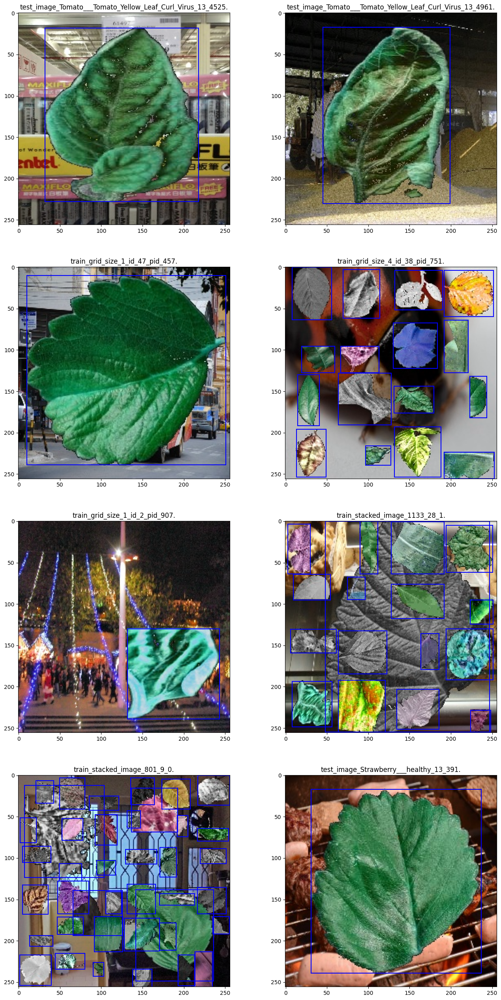

In [5]:
# We can see that the test images remain unchanged.
# The augmentation of the train images shows the leaf grid scaled to the number of leaves.
# We can see that some are cropped and their color are modified.
# Moreover, in the stacked image, the leaves are superimposed. The bounding boxes are close to the leaves.
single_im_size = 256

fig, axs = plt.subplots(4,2, figsize=(16, 32))
axs = axs.flatten()
    
for i in range(8):
    
    label_filename = random.choice(os.listdir('/kaggle/working/yolo_labels/'))
    image = cv2.imread(f"/kaggle/working/yolo_images/{label_filename[:-3]}jpg")
    axs[i].imshow(image)
    axs[i].set_title(label_filename[:-3], fontsize=12)
    axs[i].grid(False)
    
    with open(f"/kaggle/working/yolo_labels/{label_filename}", "r") as f:
        for line in f:
            splited_line = line.split(" ")
            x, y, w, h = float(splited_line[1]) * single_im_size, float(splited_line[2]) * single_im_size, float(splited_line[3]) * single_im_size, float(splited_line[4]) * single_im_size
            axs[i].add_patch(Rectangle((x-(w/2), y-(h/2)),
                                        w, h,
                                        edgecolor='blue', facecolor='none', lw=1.5)) # https://matplotlib.org/stable/api/_as_gen/matplotlib.patches.Rectangle.html
plt.show()

fig = axs[0].get_figure()
fig.savefig('/kaggle/working/augmented_images.png', bbox_inches='tight')

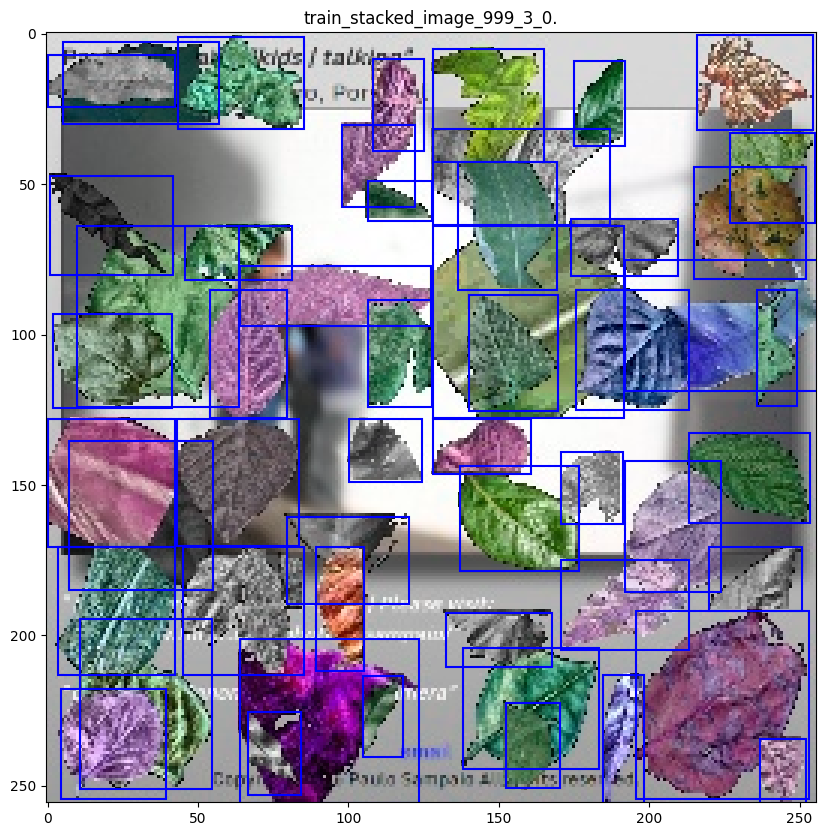

In [29]:
single_im_size = 256

fig, axs = plt.subplots(1,1, figsize=(10, 10))
    
label_filename = random.choice(os.listdir('/kaggle/working/yolo_labels/'))
image = cv2.imread(f"/kaggle/working/yolo_images/{label_filename[:-3]}jpg")
axs.imshow(image)
axs.set_title(label_filename[:-3], fontsize=12)
axs.grid(False)
    
with open(f"/kaggle/working/yolo_labels/{label_filename}", "r") as f:
    for line in f:
        splited_line = line.split(" ")
        x, y, w, h = float(splited_line[1]) * single_im_size, float(splited_line[2]) * single_im_size, float(splited_line[3]) * single_im_size, float(splited_line[4]) * single_im_size
        axs.add_patch(Rectangle((x-(w/2), y-(h/2)),w, h,
                                edgecolor='blue', facecolor='none', lw=1.5)) # https://matplotlib.org/stable/api/_as_gen/matplotlib.patches.Rectangle.html
plt.show()

fig = axs.get_figure()
fig.savefig('/kaggle/working/1_augmented_images.png', bbox_inches='tight')

https://learnopencv.com/why-does-opencv-use-bgr-color-format/

# GPU Yolov8 Training
## Kindly turn off TPU and switch to GPU.
## Yolov8 setup

In [7]:
#  Creating subset directories for yolov8.
plantvillage_path = '/kaggle/working/plantvillage/'
if not os.path.isdir(plantvillage_path):
    os.mkdir(plantvillage_path)
    
for directory in ['train', 'valid']:
    if not os.path.isdir(plantvillage_path + directory):
        os.mkdir(plantvillage_path + directory)
            
    for folder in ['images', 'labels']:
        if not os.path.isdir(plantvillage_path + directory + '/' + folder):
            os.mkdir(plantvillage_path + directory + '/' + folder)

            
# Creating the dataframe of filenames.
plantvillage_df =  pd.DataFrame(os.listdir("/kaggle/working/yolo_images"),
                                columns = ['image_filenames'])

# Changing the file extension from jpg to txt.
plantvillage_df["labels_filenames"] = plantvillage_df['image_filenames'].str.slice(0,-3) + "txt"
display(plantvillage_df.head(), plantvillage_df.shape)

# Creating the training and test subsets.
train = plantvillage_df[plantvillage_df["image_filenames"].str.contains('train')]
test = plantvillage_df[plantvillage_df["image_filenames"].str.contains('test')]

# Creating the yaml file for the yolov8 training configuration.
# Specify the path of the train and test images also, send the categories encoding.
# Here is the documentation for the dataset format : https://docs.ultralytics.com/datasets/detect/#ultralytics-yolo-format
dict_file = {'path' : '/kaggle/working/plantvillage',
             'train' : 'train/images',
             'val' : 'valid/images',
             'names' : dict(zip(range(39), os.listdir('/kaggle/input/plantvillage-dataset/segmented/')))}

with open('/kaggle/working/plantvillage/plantvillage.yaml', 'w') as file:
    doc = yaml.dump(dict_file, file)

,image_filenames,labels_filenames
0,train_grid_size_4_id_41_pid_711.jpg,train_grid_size_4_id_41_pid_711.txt
1,train_grid_size_2_id_14_pid_617.jpg,train_grid_size_2_id_14_pid_617.txt
2,train_grid_size_2_id_37_pid_1189.jpg,train_grid_size_2_id_37_pid_1189.txt
3,train_grid_size_2_id_40_pid_475.jpg,train_grid_size_2_id_40_pid_475.txt
4,train_grid_size_4_id_22_pid_493.jpg,train_grid_size_4_id_22_pid_493.txt


(35849, 2)

https://docs.ultralytics.com/yolov5/tutorials/tips_for_best_training_results/

In [ ]:
img_size = 32*8 # 32 * 8 = 256. The image size is recommended to be a multiple of 32.
batch_size = 50 # this batch size uses around 9 GB of GPU memory.
exp_name = 'yolov8x_plantvillage_1'

# Dumping subset directories.
for directory in ['train', 'valid']:
    for folder in ['images', 'labels']:
        for file in os.listdir(plantvillage_path + directory + '/' + folder):
            os.remove(plantvillage_path + directory + '/' + folder + '/' + file)

        print(plantvillage_path + directory + '/' + folder, ' number of files : ',
              len(os.listdir(plantvillage_path + directory + '/' + folder)))
        
# Copying augmented images in the Destination folders.
for data, subset_type in [(train, 'train'), (test, 'valid')]:

    # Destination folders.
    image_destination = plantvillage_path + f'{subset_type}/images/'
    label_destination = plantvillage_path + f'{subset_type}/labels/'

    for index, row in tqdm(data.iterrows()):
        shutil.copy("/kaggle/working/yolo_images/" + row.iloc[0], image_destination)
        shutil.copy("/kaggle/working/yolo_labels/" + row.iloc[1], label_destination)            

# Load a new pretrained model.
model = YOLO('yolov8x.pt') 

# Train the model : https://docs.ultralytics.com/modes/train/#arguments
results = model.train(data=plantvillage_path + 'plantvillage.yaml',  name=exp_name, task='detect',
                      epochs=200, batch=batch_size, seed=2, v5loader=True, imgsz=img_size, exist_ok=True,
                      augment=True, mosaic=0.1, degrees=0, fliplr=0, flipud=0, scale=0, translate=0, mixup=0.5)

/kaggle/working/plantvillage/train/images  number of files :  0
/kaggle/working/plantvillage/train/labels  number of files :  0
/kaggle/working/plantvillage/valid/images  number of files :  0
/kaggle/working/plantvillage/valid/labels  number of files :  0


24000it [00:09, 2550.94it/s]
10849it [00:04, 2510.45it/s]
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8x.yaml, data=/kaggle/working/plantvillage/plantvillage.yaml, epochs=200, patience=50, batch=50, imgsz=256, save=True, cache=False, device=, workers=8, project=None, name=yolov8x_plantvillage_1, exist_ok=True, pretrained=False, optimizer=SGD, verbose=False, seed=2, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=False, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, box

# Plot prediction

In [30]:
# Load the trained model.
model = YOLO('/kaggle/working/runs/detect/yolov8x_plantvillage_1/weights/best.pt') 

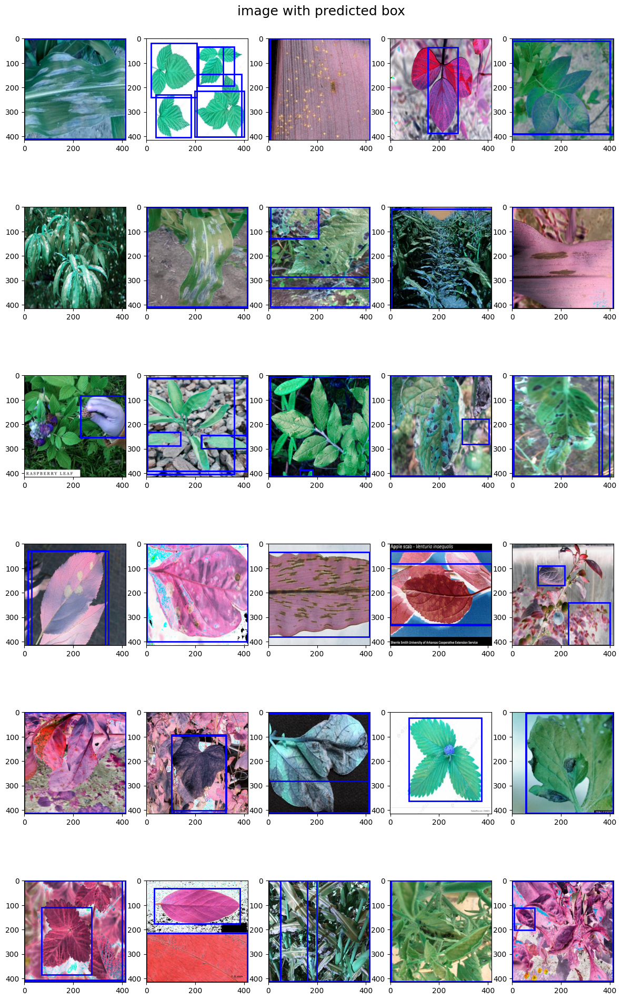

In [57]:
im_pred = os.listdir('/kaggle/input/plantdoc-v1-resize-416x416-yolov8/images')[100:130]
to_pred = []

for im in im_pred:
    
    im = cv2.imread('/kaggle/input/plantdoc-v1-resize-416x416-yolov8/images/' + im)
    to_pred.append(im)

results = model.predict(source=to_pred)

fig, axs = plt.subplots(6,5, figsize=(14, 24))
axs = axs.ravel()
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.2, 
                    hspace=0)

fig.suptitle(" image with predicted box", fontsize=18, y=0.9)

for i, (r, im) in enumerate(zip(results, to_pred)):
    
    axs[i].imshow(im)
    axs[i].grid(False)
    # Coordinates is a list containing a list of the coordinates or an empty list.    
    coordinates = r.boxes.xywh.tolist()
#     axs[i].set_title(coordinates)
    
    if coordinates:
        # Multiple box can be present.
        for box in coordinates:
            x, y, w, h = box[0], box[1], box[2], box[3] 

            axs[i].add_patch(Rectangle((x-w/2, y-h/2), w, h,
                                edgecolor='blue',
                                facecolor='none',
                                lw=2))

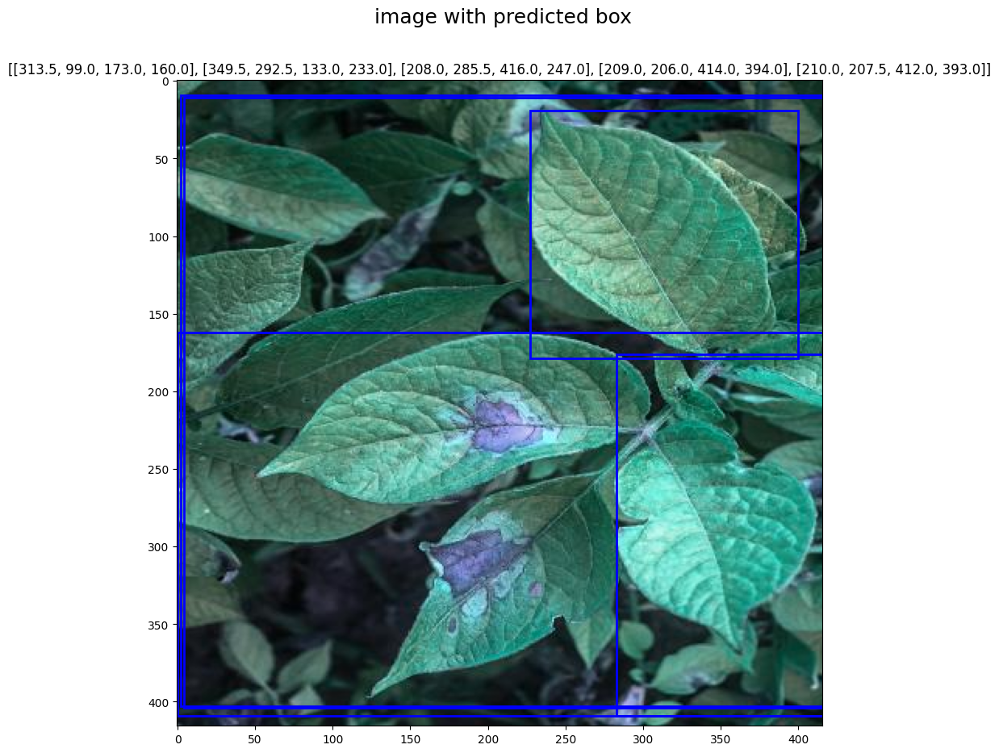

In [56]:
im_pred = random.choice(os.listdir('/kaggle/input/plantdoc-v1-resize-416x416-yolov8/images'))
im = cv2.imread('/kaggle/input/plantdoc-v1-resize-416x416-yolov8/images/' + im_pred)

results = model.predict(source=[im])

fig, axs = plt.subplots(1,1, figsize=(10, 10))
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.2, 
                    hspace=0)

fig.suptitle(" image with predicted box", fontsize=18, y=0.99)

axs.imshow(im)
axs.grid(False)
# Coordinates is a list containing a list of the coordinates or an empty list.    
coordinates = results[0].boxes.xywh.tolist()
axs.set_title(coordinates)

if coordinates:
    # Multiple box can be present.
    for box in coordinates:
        x, y, w, h = box[0], box[1], box[2], box[3] 

        axs.add_patch(Rectangle((x-w/2, y-h/2), w, h,
                            edgecolor='blue',
                            facecolor='none',
                            lw=2))
        
fig = axs.get_figure()
fig.savefig('/kaggle/working/1_predicted_images.png', bbox_inches='tight')

In [88]:
df_result = pd.read_csv("/kaggle/working/runs/detect/yolov8x_plantvillage_1/results.csv")
df_result.tail()

,epoch,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),...,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
83,83,0.26147,0.33567,0.82627,0.85811,...,0.44260,0.85886,0.005941,0.005941,0.005941
84,84,0.26338,0.34296,0.82679,0.86720,...,0.44346,0.85877,0.005892,0.005892,0.005892
85,85,0.26291,0.34218,0.82698,0.86738,...,0.44405,0.85866,0.005842,0.005842,0.005842
86,86,0.26059,0.33536,0.82628,0.87261,...,0.44211,0.85846,0.005792,0.005792,0.005792
87,87,0.25853,0.33315,0.82569,0.87366,...,0.44066,0.85842,0.005743,0.005743,0.005743


In [61]:
df_result.columns

Index(['                  epoch', '         train/box_loss',
       '         train/cls_loss', '         train/dfl_loss',
       '   metrics/precision(B)', '      metrics/recall(B)',
       '       metrics/mAP50(B)', '    metrics/mAP50-95(B)',
       '           val/box_loss', '           val/cls_loss',
       '           val/dfl_loss', '                 lr/pg0',
       '                 lr/pg1', '                 lr/pg2'],
      dtype='object')

https://docs.ultralytics.com/guides/yolo-performance-metrics/?h=metrics#introduction

#### Intersection over Union (IoU): 
#### "IoU is a measure that quantifies the overlap between a predicted bounding box and a ground truth bounding box.
#### It plays a fundamental role in evaluating the accuracy of object localization.""

#### "mAP50-95: The average of the mean average precision calculated at varying IoU thresholds, ranging from 0.50 to 0.95.
#### It gives a comprehensive view of the model's performance across different levels of detection difficulty."

In [99]:
train_box_loss = df_result["         train/box_loss"].str.replace(" ", "").values.astype("float64")
val_box_loss = df_result["           val/box_loss"].values
val_mAP50_95 = df_result["    metrics/mAP50-95(B)"].values
val_cls_loss = df_result["           val/cls_loss"].values
train_cls_loss = df_result["         train/cls_loss"].values

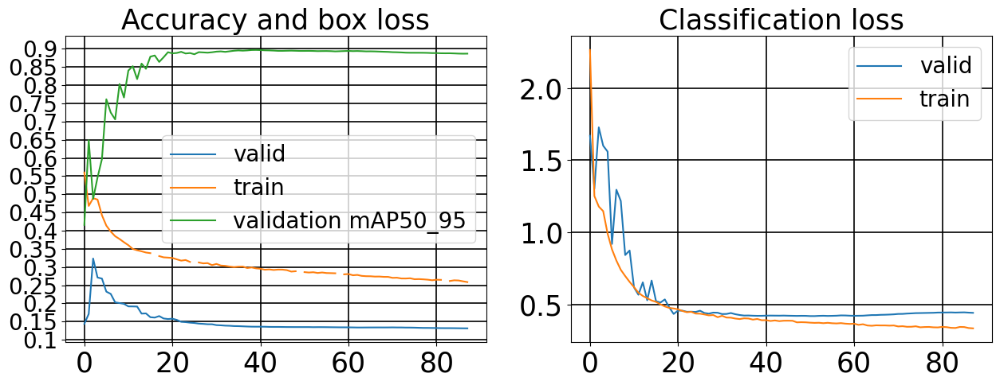

In [142]:
fig, axs = plt.subplots(1,2, figsize=(15, 5))
axs = axs.ravel()

axs[0].set_title("Accuracy and box loss", fontsize=25)
axs[0].plot(val_box_loss, label="valid")
axs[0].plot(train_box_loss, label="train")
axs[0].plot(val_mAP50_95, label="validation mAP50_95")
axs[0].legend(loc="best", fontsize="20")
axs[0].grid(visible=True, axis='both', color="black", lw=1.2)

axs[0].xaxis.set_tick_params(labelsize=25)
axs[0].set_yticks(np.round(np.arange(0.1, 0.91, 0.05), 2),
                  labels=np.round(np.arange(0.1, 0.91, 0.05), 2), fontsize=20)


axs[1].set_title("Classification loss", fontsize=25)
axs[1].plot(val_cls_loss, label="valid")
axs[1].plot(train_cls_loss, label="train")
axs[1].legend(loc="best", fontsize="20")
axs[1].grid(visible=True, axis='both', color="black", lw=1.2)

axs[1].xaxis.set_tick_params(labelsize=25)
axs[1].yaxis.set_tick_params(labelsize=25)

plt.show()

fig = axs[0].get_figure()
fig.savefig('/kaggle/working/loss_and_accuracy.png', bbox_inches='tight')